# First Orekit Notebook

##### 11/17/20: Ran 2 examples (The Basics and Using Plotly). Propagated 2 TLEs.

##### 11/18/20: Got feedback on orekit, now use to compare a truth TLE and a calculated TLE.

### Example Notebook: The Basics 

##### Download orekit-data.zip File

In [1]:
from orekit.pyhelpers import download_orekit_data_curdir

In [2]:
download_orekit_data_curdir()

##### Initiating Orekit in Python

In [3]:
import orekit

In [4]:
vm = orekit.initVM()
print('Java version:', vm.java_version)
print('Orekit version:', orekit.VERSION)

Java version: 1.8.0_152-release
Orekit version: 10.2


In [5]:
from orekit.pyhelpers import setup_orekit_curdir
setup_orekit_curdir()

In [6]:
from org.orekit.utils import Constants
print(Constants.WGS84_EARTH_EQUATORIAL_RADIUS)

6378137.0


In [7]:
from org.orekit.bodies import CelestialBodyFactory
from org.orekit.utils import PVCoordinatesProvider
from org.orekit.time import AbsoluteDate, TimeScalesFactory
from org.orekit.frames import FramesFactory

sun = CelestialBodyFactory.getSun()     # Here we get it as an CelestialBody
sun = PVCoordinatesProvider.cast_(sun)  # But we want the PVCoord interface

# Get the position of the sun in the Earth centered coordinate system EME2000
date = AbsoluteDate(2020, 2, 28, 23, 30, 0.0, TimeScalesFactory.getUTC())
sun.getPVCoordinates(date, FramesFactory.getEME2000()).getPosition()

<Vector3D: {138,869,605,874.96655; -47,461,924,824.28846; -20,575,480,674.707344}>

### Example Notebook: Using Plotly

In [8]:
%matplotlib inline

In [9]:
import orekit
vm = orekit.initVM()

In [10]:
from orekit.pyhelpers import setup_orekit_curdir, absolutedate_to_datetime
setup_orekit_curdir()

In [11]:
from org.orekit.data import DataProvidersManager, ZipJarCrawler
from org.orekit.frames import FramesFactory, TopocentricFrame
from org.orekit.bodies import OneAxisEllipsoid, GeodeticPoint
from org.orekit.time import TimeScalesFactory, AbsoluteDate, DateComponents, TimeComponents
from org.orekit.utils import IERSConventions, Constants

from org.orekit.propagation.analytical.tle import TLE, TLEPropagator
from java.io import File

from math import radians, pi
import pandas as pd
import numpy as np

##### Define Orbit

In [12]:
#SPOT-5 
tle_line1 = "1 27421U 02021A   02124.48976499 -.00021470  00000-0 -89879-2 0    20"
tle_line2 = "2 27421  98.7490 199.5121 0001333 133.9522 226.1918 14.26113993    62"

In [13]:
mytle = TLE(tle_line1, tle_line2) # create TLE object

In [14]:
mytle.getDate()

<AbsoluteDate: 2002-05-04T11:45:15.695>

##### Define Planet Earth

In [15]:
ITRF = FramesFactory.getITRF(IERSConventions.IERS_2010, True)
earth = OneAxisEllipsoid(Constants.WGS84_EARTH_EQUATORIAL_RADIUS,
                        Constants.WGS84_EARTH_FLATTENING,
                        ITRF)

In [16]:
earth.flattening

0.0033528106647474805

##### Define a Station

In [17]:
longitude = radians(21.063)
latitude  = radians(67.878)
altitude  = 341.0
station1 = GeodeticPoint(latitude, longitude, altitude)
sta1Frame = TopocentricFrame(earth, station1, "Esrange")

##### Set Up Propagation

In [18]:
initialDate = AbsoluteDate(DateComponents(2002, 5, 7),
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())

inertialFrame = FramesFactory.getEME2000()

propagator = TLEPropagator.selectExtrapolator(mytle)

In [19]:
pvs = []
extrapDate = initialDate
finalDate = extrapDate.shiftedBy(60.0 * 60 * 24 * 3) #[s]

while (extrapDate.compareTo(finalDate) <= 0.0):
    pv = propagator.getPVCoordinates(extrapDate, inertialFrame)
    pvs.append(pv)
    extrapDate = extrapDate.shiftedBy(20.0)

In [20]:
prop_data = pd.DataFrame(data=pvs, columns=['pv'])

prop_data['Position'] = prop_data['pv'].apply(lambda x: x.getPosition())
prop_data['datetime'] = prop_data['pv'].apply(lambda x: absolutedate_to_datetime(x.getDate()))
prop_data['elevation'] = prop_data['pv'].apply(lambda x: sta1Frame.getElevation(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data['azimuth'] = prop_data['pv'].apply(lambda x: sta1Frame.getAzimuth(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
# prop_data.pop('pv')
prop_data.set_index('datetime', inplace=True, drop=False)
prop_data.index.name = 'Timestamp'

In [21]:
prop_data.head()

,pv,Position,datetime,elevation,azimuth
Timestamp,,,,,
2002-05-07 00:00:00,"{2002-05-07T00:00:00.000, P(-746330.6708308915...","{-746,330.6708308915; -1,463,626.22678806; -7,...",2002-05-07 00:00:00,-71.287402,181.060576
2002-05-07 00:00:20,"{2002-05-07T00:00:20.000, P(-883435.5562218677...","{-883,435.5562218677; -1,514,542.4907364363; -...",2002-05-07 00:00:20,-70.825293,182.482355
2002-05-07 00:00:40,"{2002-05-07T00:00:40.000, P(-1020163.513606485...","{-1,020,163.5136064853; -1,564,812.5611889178;...",2002-05-07 00:00:40,-70.355643,183.850049
2002-05-07 00:01:00,"{2002-05-07T00:01:00.000, P(-1156456.184620729...","{-1,156,456.1846207299; -1,614,414.9561095473;...",2002-05-07 00:01:00,-69.878974,185.166756
2002-05-07 00:01:20,"{2002-05-07T00:01:20.000, P(-1292255.388093741...","{-1,292,255.3880937414; -1,663,328.472507268; ...",2002-05-07 00:01:20,-69.395767,186.435438


In [22]:
prop_data['groundpoint'] = prop_data['pv'].apply(lambda pv: earth.transform(pv.position, inertialFrame, pv.date))
prop_data['latitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.latitude))
prop_data['longitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.longitude))
prop_data['day'] = prop_data.datetime.dt.dayofyear
prop_data['hour'] = prop_data.datetime.dt.hour

In [23]:
prop_data['visible'] = prop_data.elevation.apply(lambda el: 'Yes' if el>0 else 'No')

##### Plot Results with Pandas

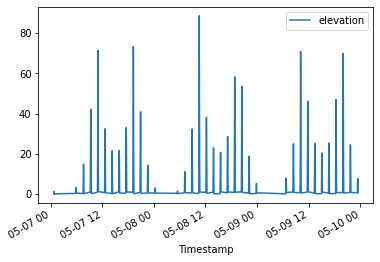

In [24]:
prop_data[prop_data.elevation>0]['2002-05-07':'2002-05-09'].plot(y='elevation');

##### Plot Results with Plotly

In [25]:
import plotly.express as px

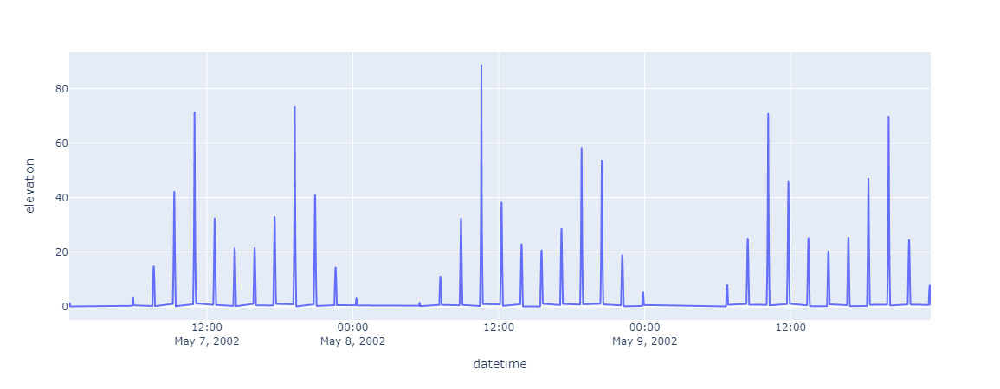

In [26]:
px.line(prop_data[prop_data.elevation>0], y='elevation', x='datetime', hover_name="datetime", 
        hover_data=['azimuth',
                    'elevation',
                    'latitude',
                    'longitude'])

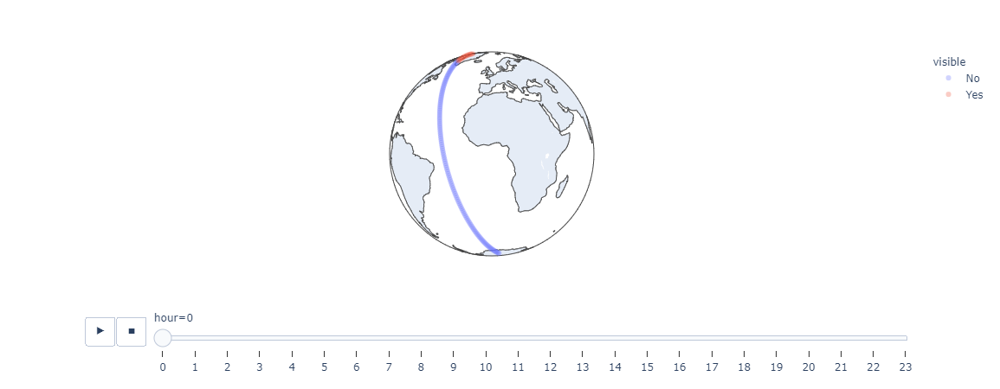

In [27]:
px.scatter_geo(prop_data['2002-05-07':'2002-05-07'],
               animation_frame='hour',
               color='visible',
               lat='latitude',
               lon='longitude',
               opacity=0.3,
               hover_data=['elevation', 'azimuth'],
           projection='orthographic',)

### Propagate 2 TLEs

In [119]:
#CSIM-FD (Nov. 6, 2020) {calculated in MATLAB app from STK truth pos. data}
tle_line1_1 = '1 43793U 18099AM  20316.15573444  .00001174  00000+0  10904-3 0  9997'
tle_line2_2 = '2 43793  101.759  260.1566 0047611  161.4263 224.4779 15.05494598105624'

#CSIM-FD (Nov. 11, 2020) {from CelesTrak}
tle_line1_2 = '1 43793U 18099AM  20316.15573444  .00001174  00000+0  10904-3 0  9997'
tle_line2_2 = '2 43793  97.6910  25.5582 0014262  63.1303 297.1374 14.96214598105624'

#CSIM-FD (Nov. 17, 2020) {from CelesTrak}
# tle_line1_3 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
# tle_line2_3 = '2 43793  97.6901  32.0620 0013721  41.5085 318.7175 14.96224559106613'

In [120]:
mytle_1 = TLE(tle_line1_1, tle_line2_1) # create TLE object for TLE 1
mytle_2 = TLE(tle_line1_2, tle_line2_2) # create TLE object for TLE 2

In [121]:
ITRF = FramesFactory.getITRF(IERSConventions.IERS_2010, True)
earth = OneAxisEllipsoid(Constants.WGS84_EARTH_EQUATORIAL_RADIUS,
                        Constants.WGS84_EARTH_FLATTENING,
                        ITRF)

In [122]:
longitude = radians(-105.270556)
latitude  = radians(40.015)
altitude  = 1655.0 #[m]
station1 = GeodeticPoint(latitude, longitude, altitude)
sta1Frame = TopocentricFrame(earth, station1, "Esrange")

In [123]:
initialDate_1 = AbsoluteDate(DateComponents(2020, 11, 6), #(year, month, day)
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())
initialDate_2 = AbsoluteDate(DateComponents(2020, 11, 11),
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())

inertialFrame = FramesFactory.getEME2000()

propagator_1 = TLEPropagator.selectExtrapolator(mytle_1)
propagator_2 = TLEPropagator.selectExtrapolator(mytle_2)

In [124]:
# propagate TLE 1
pvs_1 = []
extrapDate_1 = initialDate_1
finalDate_1 = extrapDate_1.shiftedBy(60.0 * 60 * 24 * 5) #[s]
while (extrapDate_1.compareTo(finalDate_1) <= 0.0):
    pv = propagator_1.getPVCoordinates(extrapDate_1, inertialFrame)
    pvs_1.append(pv)
    extrapDate_1 = extrapDate_1.shiftedBy(20.0)

# propagate TLE 2
pvs_2 = []
extrapDate_2 = initialDate_2
finalDate_2 = extrapDate_2.shiftedBy(60.0 * 60 * 24 * 3) #[s]
while (extrapDate_2.compareTo(finalDate_2) <= 0.0):
    pv = propagator_2.getPVCoordinates(extrapDate_2, inertialFrame)
    pvs_2.append(pv)
    extrapDate_2 = extrapDate_2.shiftedBy(20.0)
    
# combine into one list
pvs = pvs_1 + pvs_2

In [125]:
# create pandas DataFrame of the propagated data for TLEs
prop_data = pd.DataFrame(data=pvs, columns=['pv'])

prop_data['Position'] = prop_data['pv'].apply(lambda x: x.getPosition())
prop_data['datetime'] = prop_data['pv'].apply(lambda x: absolutedate_to_datetime(x.getDate()))
prop_data['elevation'] = prop_data['pv'].apply(lambda x: sta1Frame.getElevation(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data['azimuth'] = prop_data['pv'].apply(lambda x: sta1Frame.getAzimuth(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data['groundpoint'] = prop_data['pv'].apply(lambda pv: earth.transform(pv.position, inertialFrame, pv.date))
prop_data['latitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.latitude))
prop_data['longitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.longitude))
prop_data['day'] = prop_data.datetime.dt.dayofyear
prop_data['hour'] = prop_data.datetime.dt.hour
prop_data['visible'] = prop_data.elevation.apply(lambda el: 'Yes' if el>0 else 'No')
prop_data.set_index('datetime', inplace=True, drop=False)
prop_data.index.name = 'Timestamp'

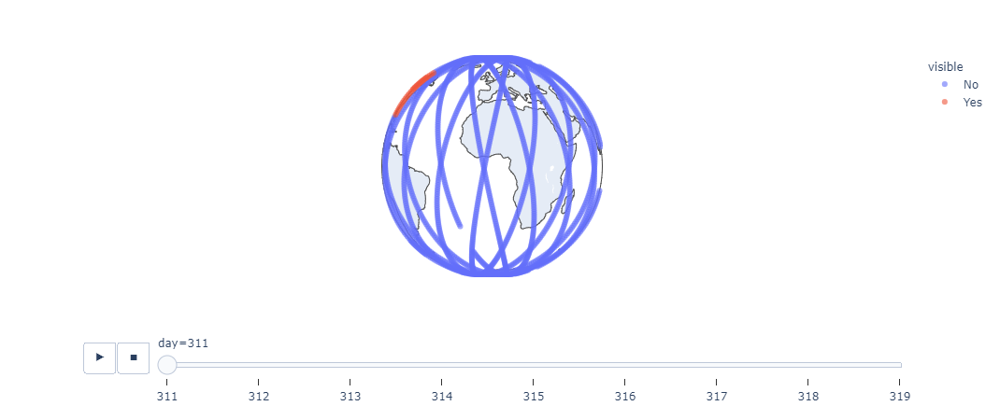

In [126]:
import plotly.express as px
px.scatter_geo(prop_data['2020-11-17':],
               animation_frame='day',
               color='visible',
               lat='latitude',
               lon='longitude',
               opacity=0.6,
               hover_data=['elevation', 'hour'],
               projection='orthographic',
              )

### TLE Comparison (Hour of passover, Az angle, EL angle)

In [202]:
#CSIM-FD (Nov. 17, 2020) {CelesTrak}
tle_line1_1 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
tle_line2_1 = '2 43793  97.6901  32.0620 0013721  41.5085 318.7175 14.96224559106613'

#CSIM-FD (Nov. 17, 2020) {Calculated from purturbed position data}
tle_line1_2 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
tle_line2_2 = '2 43793  99.4649  44.4416 0093542  329.6869 163.7718 15.1782000106613'

#CSIM-FD (Nov. 17, 2020) {Calculated from WORSE purturbed position data}
tle_line1_3 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
tle_line2_3 = '2 43793  99.3581  44.5458 0288570  117.3180  15.5230 14.3573000106613'

In [203]:
mytle_1 = TLE(tle_line1_1, tle_line2_1) # create TLE object for TLE 1
mytle_2 = TLE(tle_line1_2, tle_line2_2) # create TLE object for TLE 2
mytle_3 = TLE(tle_line1_3, tle_line2_3) # create TLE object for TLE 3

In [204]:
ITRF = FramesFactory.getITRF(IERSConventions.IERS_2010, True)
earth = OneAxisEllipsoid(Constants.WGS84_EARTH_EQUATORIAL_RADIUS,
                        Constants.WGS84_EARTH_FLATTENING,
                        ITRF)

In [205]:
longitude = radians(-105.270556)
latitude  = radians(40.015)
altitude  = 1655.0 #[m]
station1 = GeodeticPoint(latitude, longitude, altitude)
sta1Frame = TopocentricFrame(earth, station1, "Esrange")

In [206]:
initialDate_1 = AbsoluteDate(DateComponents(2020, 11, 17), #(year, month, day)
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())
initialDate_2 = AbsoluteDate(DateComponents(2020, 11, 17),
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())
initialDate_3 = AbsoluteDate(DateComponents(2020, 11, 17),
                           TimeComponents.H00,
                           TimeScalesFactory.getUTC())

inertialFrame = FramesFactory.getEME2000()

propagator_1 = TLEPropagator.selectExtrapolator(mytle_1)
propagator_2 = TLEPropagator.selectExtrapolator(mytle_2)
propagator_3 = TLEPropagator.selectExtrapolator(mytle_3)

In [207]:
# propagate TLE 1
pvs_1 = []
extrapDate_1 = initialDate_1
finalDate_1 = extrapDate_1.shiftedBy(60.0 * 60 * 24 * 7) #[s]
while (extrapDate_1.compareTo(finalDate_1) <= 0.0):
    pv = propagator_1.getPVCoordinates(extrapDate_1, inertialFrame)
    pvs_1.append(pv)
    extrapDate_1 = extrapDate_1.shiftedBy(20.0)

# propagate TLE 2
pvs_2 = []
extrapDate_2 = initialDate_2
finalDate_2 = extrapDate_2.shiftedBy(60.0 * 60 * 24 * 7) #[s]
while (extrapDate_2.compareTo(finalDate_2) <= 0.0):
    pv = propagator_2.getPVCoordinates(extrapDate_2, inertialFrame)
    pvs_2.append(pv)
    extrapDate_2 = extrapDate_2.shiftedBy(20.0)
    
# propagate TLE 3
pvs_3 = []
extrapDate_3 = initialDate_3
finalDate_3 = extrapDate_3.shiftedBy(60.0 * 60 * 24 * 7) #[s]
while (extrapDate_3.compareTo(finalDate_3) <= 0.0):
    pv = propagator_3.getPVCoordinates(extrapDate_3, inertialFrame)
    pvs_3.append(pv)
    extrapDate_3 = extrapDate_3.shiftedBy(20.0)
    
# combine into one list
pvs = pvs_1 + pvs_2
pvs_WORSE = pvs_1 + pvs_3

In [225]:
from numpy import array, ones

# create pandas DataFrame of the propagated data for pvs TLEs
prop_data = pd.DataFrame(data=pvs, columns=['pv'])

prop_data['Position'] = prop_data['pv'].apply(lambda x: x.getPosition())
prop_data['datetime'] = prop_data['pv'].apply(lambda x: absolutedate_to_datetime(x.getDate()))
prop_data['elevation'] = prop_data['pv'].apply(lambda x: sta1Frame.getElevation(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data['azimuth'] = prop_data['pv'].apply(lambda x: sta1Frame.getAzimuth(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data['groundpoint'] = prop_data['pv'].apply(lambda pv: earth.transform(pv.position, inertialFrame, pv.date))
prop_data['latitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.latitude))
prop_data['longitude'] = np.degrees(prop_data.groundpoint.apply(lambda gp: gp.longitude))
prop_data['day'] = prop_data.datetime.dt.dayofyear
prop_data['hour'] = prop_data.datetime.dt.hour
prop_data['minute'] = prop_data.datetime.dt.minute
prop_data['visible'] = prop_data.elevation.apply(lambda el: True if (el>0) else False)
prop_data['truth'] = list(map(int, list(numpy.ones(int(len(prop_data)/2))) + list(numpy.zeros(int(len(prop_data)/2)))))
prop_data['truth'] = prop_data.truth.apply(lambda t: True if (t==1) else False)
prop_data.set_index('datetime', inplace=True, drop=False)
prop_data.index.name = 'Timestamp'

# create pandas DataFrame of the propagated data for pvs_WORSE TLEs
prop_data_WORSE = pd.DataFrame(data=pvs_WORSE, columns=['pv'])

prop_data_WORSE['Position'] = prop_data_WORSE['pv'].apply(lambda x: x.getPosition())
prop_data_WORSE['datetime'] = prop_data_WORSE['pv'].apply(lambda x: absolutedate_to_datetime(x.getDate()))
prop_data_WORSE['elevation'] = prop_data_WORSE['pv'].apply(lambda x: sta1Frame.getElevation(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data_WORSE['azimuth'] = prop_data_WORSE['pv'].apply(lambda x: sta1Frame.getAzimuth(x.getPosition(), inertialFrame, x.getDate())*180.0/pi )
prop_data_WORSE['groundpoint'] = prop_data_WORSE['pv'].apply(lambda pv: earth.transform(pv.position, inertialFrame, pv.date))
prop_data_WORSE['latitude'] = np.degrees(prop_data_WORSE.groundpoint.apply(lambda gp: gp.latitude))
prop_data_WORSE['longitude'] = np.degrees(prop_data_WORSE.groundpoint.apply(lambda gp: gp.longitude))
prop_data_WORSE['day'] = prop_data_WORSE.datetime.dt.dayofyear
prop_data_WORSE['hour'] = prop_data_WORSE.datetime.dt.hour
prop_data_WORSE['minute'] = prop_data_WORSE.datetime.dt.minute
prop_data_WORSE['visible'] = prop_data_WORSE.elevation.apply(lambda el: True if (el>10) else False)
prop_data_WORSE['truth'] = list(map(int, list(numpy.ones(int(len(prop_data_WORSE)/2))) + list(numpy.zeros(int(len(prop_data_WORSE)/2)))))
prop_data_WORSE['truth'] = prop_data_WORSE.truth.apply(lambda t: True if (t==1) else False)
prop_data_WORSE.set_index('datetime', inplace=True, drop=False)
prop_data_WORSE.index.name = 'Timestamp'

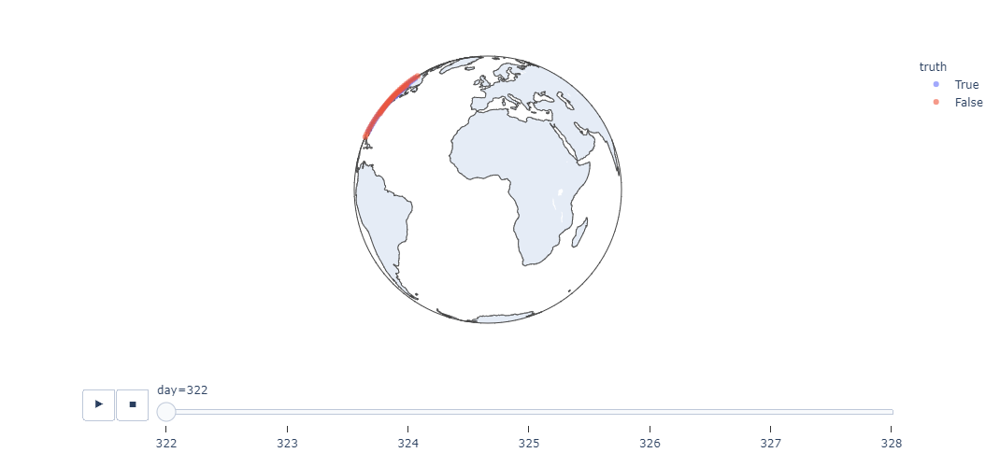

In [226]:
import plotly.express as px
px.scatter_geo(prop_data[prop_data['visible']],
               animation_frame='day',
               color='truth',
               lat='latitude',
               lon='longitude',
               opacity=0.6,
               hover_data=['azimuth', 'elevation', 'hour', 'minute'],
               projection='orthographic',
               height=500,
              )

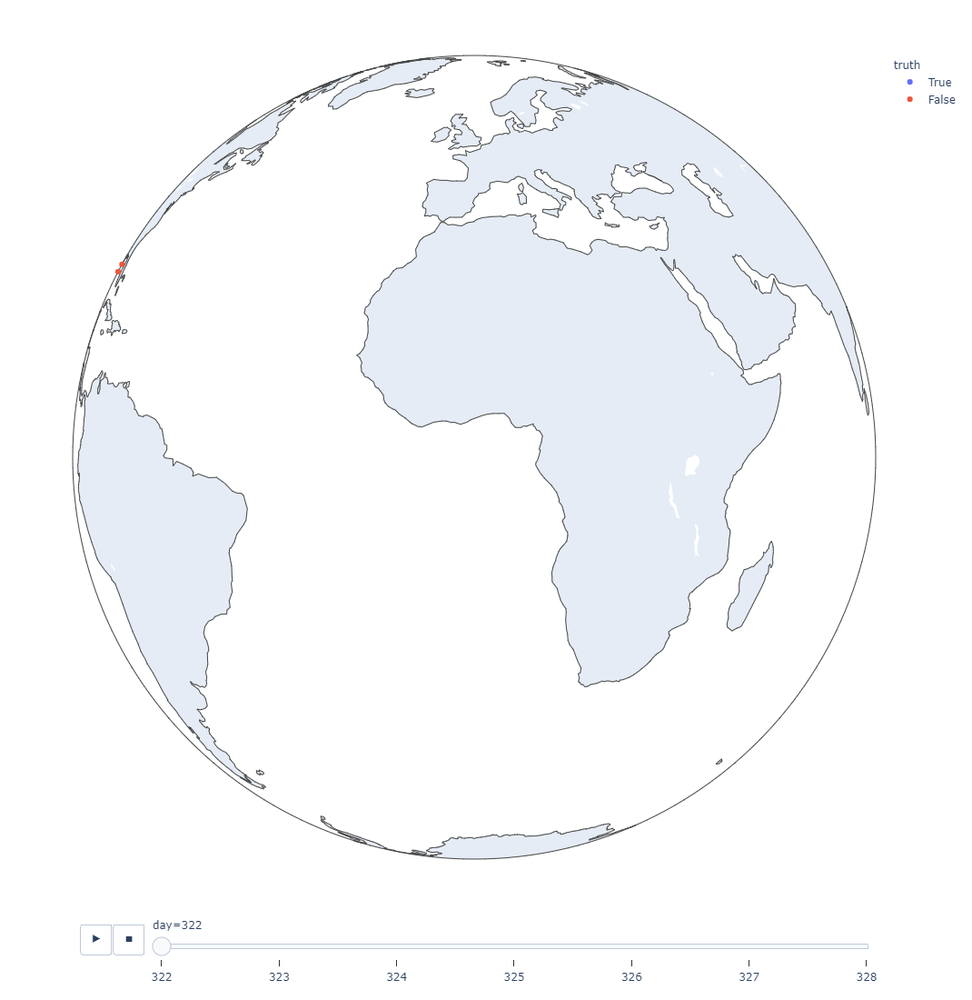

In [233]:
px.scatter_geo(prop_data_WORSE[prop_data_WORSE['visible']],
               animation_frame='day',
               color='truth',
               lat='latitude',
               lon='longitude',
               opacity=1,
               hover_data=['azimuth', 'elevation', 'hour', 'minute'],
               projection='orthographic',
               height=1100,
              )

In [149]:
60482 / 2

30241.0

In [192]:
prop_data[prop_data['visible']]

,pv,Position,datetime,elevation,azimuth,groundpoint,latitude,longitude,day,hour,minute,visible,truth
Timestamp,,,,,,,,,,,,,
2020-11-17 02:47:00,"{2020-11-17T02:47:00.000, P(4588420.591164197,...","{4,588,420.591164197; 2,006,312.744838007; 4,8...",2020-11-17 02:47:00,0.324055,69.624762,"{lat: 44.1245460003 deg, lon: -74.4490454507 d...",44.124546,-74.449045,322,2,47,True,True
2020-11-17 02:47:20,"{2020-11-17T02:47:20.000, P(4504025.989744488,...","{4,504,025.989744488; 1,938,471.0842435122; 4,...",2020-11-17 02:47:20,0.605642,66.470575,"{lat: 45.3537235753 deg, lon: -74.8625267006 d...",45.353724,-74.862527,322,2,47,True,True
2020-11-17 02:47:40,"{2020-11-17T02:47:40.000, P(4417490.554918439,...","{4,417,490.554918439; 1,869,708.0496211613; 5,...",2020-11-17 02:47:40,0.822122,63.252371,"{lat: 46.5816087586 deg, lon: -75.2905781628 d...",46.581609,-75.290578,322,2,47,True,True
2020-11-17 02:48:00,"{2020-11-17T02:48:00.000, P(4328855.572398052,...","{4,328,855.572398052; 1,800,056.3906358676; 5,...",2020-11-17 02:48:00,0.969799,59.986898,"{lat: 47.8081101541 deg, lon: -75.7345104204 d...",47.808110,-75.734510,322,2,48,True,True
2020-11-17 02:48:20,"{2020-11-17T02:48:20.000, P(4238163.325269145,...","{4,238,163.325269145; 1,729,549.2767865749; 5,...",2020-11-17 02:48:20,1.046052,56.692587,"{lat: 49.0331265539 deg, lon: -76.1957843607 d...",49.033127,-76.195784,322,2,48,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23 20:15:00,"{2020-11-23T20:15:00.000, P(-3043480.082054216...","{-3,043,480.082054216; -4,909,955.340596867; 3...",2020-11-23 20:15:00,4.309071,259.200159,"{lat: 33.8869457879 deg, lon: -128.5995916649 ...",33.886946,-128.599592,328,20,15,True,False
2020-11-23 20:15:20,"{2020-11-23T20:15:20.000, P(-3111549.715383580...","{-3,111,549.7153835804; -4,962,624.902984447; ...",2020-11-23 20:15:20,3.325585,256.415406,"{lat: 32.6649247394 deg, lon: -128.974512092 d...",32.664925,-128.974512,328,20,15,True,False
2020-11-23 20:15:40,"{2020-11-23T20:15:40.000, P(-3178142.627337652...","{-3,178,142.6273376523; -5,012,939.24390343; 3...",2020-11-23 20:15:40,2.336057,253.845943,"{lat: 31.4418445818 deg, lon: -129.3416529725 ...",31.441845,-129.341653,328,20,15,True,False


In [234]:
#CSIM-FD (Nov. 17, 2020) {CelesTrak}
tle_line1_1 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
tle_line2_1 = '2 43793  97.6901  32.0620 0013721  41.5085 318.7175 14.96224559106613'

#CSIM-FD (Nov. 17, 2020) {Calculated from purturbed position data}
tle_line1_2 = '1 43793U 18099AM  20322.77650623  .00000294  00000-0  31140-4 0  9996'
tle_line2_2 = '2 43793  99.3581  44.5458 0288570  117.3180  15.5230 14.3573000106613'